In [1]:
%matplotlib inline
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def load_calibration(calibration_file):
    """
    Load calibration parameters from calibration file

    :param calibration_file: Txt file with calibration parameters
    :return Intrinsic camera matrix
    """
    with open(calibration_file, 'r') as f:
        fx, fy, cx, cy = map(float, f.readline().split())
        camera_matrix = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])

    return camera_matrix


def compute_initial_transform(img_left, img_right):
    """
    Get homography matrix to roughly transform the left image into the right

    :param img_left: Grayscale left image
    :param img_right: Grayscale right image
    :return Homography matrix
    """
    # Detect features using SIFT
    sift = cv2.SIFT_create()
    keypoints_left, descriptors_left = sift.detectAndCompute(img_left, None)
    keypoints_right, descriptors_right = sift.detectAndCompute(img_right, None)

    # Match features using FLANN
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descriptors_left, descriptors_right, k=2)

    # Filter matches using the Lowe's ratio test
    good_matches = [m for m, n in matches if m.distance < 0.7*n.distance]

    # Get location of good matches
    points_left = np.float32([keypoints_left[m.queryIdx].pt for m in good_matches])
    points_right = np.float32([keypoints_right[m.trainIdx].pt for m in good_matches])

    # Find homography matrix
    H, _ = cv2.findHomography(points_left, points_right, cv2.RANSAC, 5.0)

    return H


def template_matching(H, img_left, img_right, template_size=36, spacing=6, search_radius_x=80, search_radius_y=20, variance_threshold=6):
    """
    Template match left and right images using homography matrix determine search areas

    :param H: Homography matrix
    :param img_left: Grayscale left image
    :param img_right: Grayscale right image
    :param template_size: Size of template
    :param spacing: Distance between template centers
    :param search_radius_x: Horizontal radius to search for template
    :param search_radius_y: Veritcal radius to search for template
    :param variance_threshold: Minimum variance in colour for the template to have significant features
    :return Center of each matched point in left image
    :return Center of each matched point in right image
    """
    template_centers_left = []
    template_centers_right = []
    search_area_centers = []

    # Iterate over left image to create templates and match them in the right image
    for y in range(2*template_size, img_left.shape[0] - template_size, spacing):
        for x in range(3*template_size, img_left.shape[1] - 2*template_size, spacing):
            template = img_left[y:y+template_size, x:x+template_size]

            # Check if the template has significant features
            if np.var(template) < variance_threshold:
                continue  # Skip templates on a smooth surface

            center_x = x + template_size // 2
            center_y = y + template_size // 2
            template_centers_left.append([center_x, center_y])

            # Transform the center point using the homography matrix
            center_homogeneous = np.array([[center_x, center_y, 1]]).T
            transformed_center_homogeneous = np.dot(H, center_homogeneous)
            transformed_center = transformed_center_homogeneous[:2] / transformed_center_homogeneous[2]
            search_area_centers.append(transformed_center)

            rx, ry = transformed_center.ravel()

            # Define the search window in the right image
            top_left_x = int(max(rx - search_radius_x, 0))
            top_left_y = int(max(ry - search_radius_y, 0))
            bottom_right_x = int(min(rx + search_radius_x, img_right.shape[1] - 1))
            bottom_right_y = int(min(ry + search_radius_y, img_right.shape[0] - 1))
            search_window = img_right[top_left_y:bottom_right_y, top_left_x:bottom_right_x]

            # Perform template matching within this search window
            res = cv2.matchTemplate(search_window, template, cv2.TM_CCOEFF_NORMED)
            _, _, _, max_loc = cv2.minMaxLoc(res)

            # Calculate the exact location of the template match in the right image
            match_x = top_left_x + max_loc[0] + template_size // 2
            match_y = top_left_y + max_loc[1] + template_size // 2
            template_centers_right.append((match_x, match_y))

    return np.array(template_centers_left), np.array(template_centers_right), search_area_centers


def plot_searches(img_right, search_area_centers, points_right):
    plt.figure(figsize=(80, 80))
    plt.imshow(img_right, cmap='gray')
    plt.title('Right Image with Template Matches')

    for i in range(len(search_area_centers)):
        x0 = search_area_centers[i][0][0]
        y0 = search_area_centers[i][1][0]
        x1 = points_right[i][0]
        y1 = points_right[i][1]

        dx = x1 - x0
        dy = y1 - y0

        plt.arrow(x0, y0, dx, dy, color=np.random.rand(3), width=0.2,
                head_width=1.5, head_length=1.5)
    plt.show()
    

def compute_disparities(points_left, points_right, K_left, K_right):
    """
    Compute disparities between matched points in each image

    :param points_left: Matched points in left image
    :param points_right: Matched points in right image
    :param K_left: Intrinsic properties of left camera
    :param K_right: Intrinsic properties of right camera
    :return Array of disparities
    """
    disparities = np.empty(len(points_left))
    for i, (pt_l, pt_r) in enumerate(zip(points_left, points_right)):
        # Convert pixel coordinates to camera coordinates
        x_l = (pt_l[0] - K_left[0, 2]) / K_left[0, 0]
        x_r = (pt_r[0] - K_right[0, 2]) / K_right[0, 0]
        disparities[i] = x_l - x_r

    return disparities


def compute_depth(disparities, baseline, f_left, f_right, disparity_threshold):
    """
    Compute depth from disparities and camrea properties

    :param disparities: Array of disparities
    :param baseline: Distance between the two camera centers
    :param f_left: Focal length of the left camera
    :param f_right: Focal length of the right camera
    :param disparity_threshold: The minimum valid disparity value
    :return Array of depth values
    """

    # Use the harmonic mean of the focal lengths as the combined focal length
    f_combined = 2 * (f_left * f_right) / (f_left + f_right)

    # Compute depth values, handling very small disparities
    with np.errstate(divide='ignore', invalid='ignore'):        # Ignore division by zero and invalid operations
        disparities[disparities < disparity_threshold] = np.nan # Set very small disparities to NaN
        depth_map = (f_combined * baseline) / disparities

    # Remove depths outside of 2 standard deviations
    valid_depths = depth_map[~np.isnan(depth_map)]
    mean_depth = np.mean(valid_depths)
    std_depth = np.std(valid_depths)
    two_stds_below = mean_depth - 2 * std_depth
    two_stds_above = mean_depth + 2 * std_depth
    depth_map_filtered = np.copy(depth_map)
    depth_map_filtered[(depth_map_filtered < two_stds_below) | (depth_map_filtered > two_stds_above)] = np.nan

    return depth_map_filtered


def plot_depth_map(img_points_3D):
    # Normalize map depth for color mapping
    normalized_depth_map = (img_points_3D[:, 2] - np.min(img_points_3D[:, 2])) / (np.max(img_points_3D[:, 2]) - np.min(img_points_3D[:, 2]))

    plt.figure(figsize=(20,8))
    plt.scatter(img_points_3D[:, 0], -img_points_3D[:, 1], c=normalized_depth_map, cmap='jet')
    plt.colorbar(label='Normalized Depth')
    plt.xlabel('X image coordinate (pixels)')
    plt.ylabel('Y image coordinate (pixels)')
    plt.title('Depth Map')
    plt.axis('equal')
    plt.show()
    

def remove_isolated_points(img_points, min_distance):
    """
    Remove outlying points

    :param points: An n x 3 numpy array of xyz coordinates.
    :param min_distance: The minimum distance threshold to consider a point not isolated.
    :return img_points with outliers removed
    """
    to_keep = []

    for i in range(len(img_points)):
        # Compute the distance from the current point to all other points
        distances = np.sqrt(np.sum((img_points - img_points[i]) ** 2, axis=1))

        # Check if there is any point within min_distance, excluding the point itself
        if np.any(distances < min_distance, where=np.arange(len(img_points)) != i):
            to_keep.append(i)

    # Filter and keep only the points that are not isolated
    filtered_points = img_points[to_keep]

    return filtered_points


def get_point_colors(img, img_points_3D):
    """
    Get color of each point in cloud
    
    :param img: Colored left image
    :param img_points_3D: Point coordinates in image
    :return Color of each point
    """
    x = img_points_3D[:, 0].astype(int)
    y = img_points_3D[:, 1].astype(int)
    img_array = np.array(img)
    colors = img_array[y, x]

    return colors


def img2projected(img_points_3D):
    """
    Convert from image coordinates in pixels to projected coordinates in meters

    :param img_points_3D: x, y, and depth in image coordinates
    :return Projected coordinates
    """
    T = np.diag([0.004, -0.002, 1.6*10e-8])
    points_3D = img_points_3D @ T

    points_3D[:, 0] -= (max(points_3D[:, 0]) + min(points_3D[:, 0])) /2
    points_3D[:, 1] -= min(points_3D[:, 1])
    points_3D[:, 0] *= points_3D[:, 2] * 0.2

    return points_3D


def plot_point_cloud(img_points_3D, colors, elev=30, azim=30, ym=-1):
    x = img_points_3D[:, 0]
    y = img_points_3D[:, 1] * ym
    z = img_points_3D[:, 2]
    colors_norm = colors / 255.0  # Normalize the pixel values for matplotlib

    fig = plt.figure(figsize=(20, 20))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot of the points with the color from the image
    ax.scatter(x, z, y, c=colors_norm, cmap='gray')

    if ym == -1:
        ax.set_xlabel('X image coordinate (pixels)')
        ax.set_zlabel('Y image coordinate (pixels)')
        ax.set_ylabel('Distance from Camera')
        ax.set_title('3D Visualization of Image Points')
    else:
        ax.set_xlabel('X (m)')
        ax.set_ylabel('Y (m)')
        ax.set_zlabel('Z (m)')
        ax.set_title('3D Visualization of Projected Points')
        ax.set_zlim(-0.5, 3.5)

    # Set the view angle
    ax.view_init(elev=elev, azim=azim)
    plt.show()


def plot_point_cloud_2D(img_points_3D, colors):
    x = img_points_3D[:, 0]
    y = img_points_3D[:, 1]
    colors_norm = colors / 255.0  # Normalize the pixel values for matplotlib

    plt.figure(figsize=(20, 10))
    plt.scatter(x, y, c=colors_norm, cmap='gray', s=8)

    plt.xlabel('X (m)')
    plt.ylabel('Y (m)')
    plt.title('Front View of Point Cloud')
    plt.grid(True)
    plt.axis('equal')
    plt.show()

In [2]:
# Image paths
left_img_path = 'imL.png'
right_img_path = 'imR.png'

# Load images
img_left = cv2.imread(left_img_path, cv2.IMREAD_GRAYSCALE)
img_right = cv2.imread(right_img_path, cv2.IMREAD_GRAYSCALE)
img_left_colored = Image.open(left_img_path)

# Load intrinsic parameters
K_left = load_calibration('calibration_l.txt')
K_right = load_calibration('calibration_r.txt')

f_left = K_left[0, 0]   # Focal lengths
f_right = K_right[0, 0]

baseline = 536.62

# Get homography matrix to roughly transform the left image into the right
H = compute_initial_transform(img_left, img_right)

# Template match left and right images using homography matrix determine search areas
points_left, points_right, search_area_centers = template_matching(H, img_left, img_right)

# Compute disparities from image match points
disparities = compute_disparities(points_left, points_right, K_left, K_right)

# Compute depth map from disparities
depth_map = compute_depth(disparities, baseline, f_left, f_right, 0.01)

# Combine the valid image coordinates with their depths
valid_indices = ~np.isnan(depth_map)
img_points_3D0 = np.column_stack((points_left[valid_indices], depth_map[valid_indices]))

# Remove outliers from img_points_3D
img_points_3D = remove_isolated_points(img_points_3D0, 10)

# Get color of each point in cloud
colors = get_point_colors(img_left_colored, img_points_3D)

# Convert from image to projected coordinates
projected_points_3D = img2projected(img_points_3D)

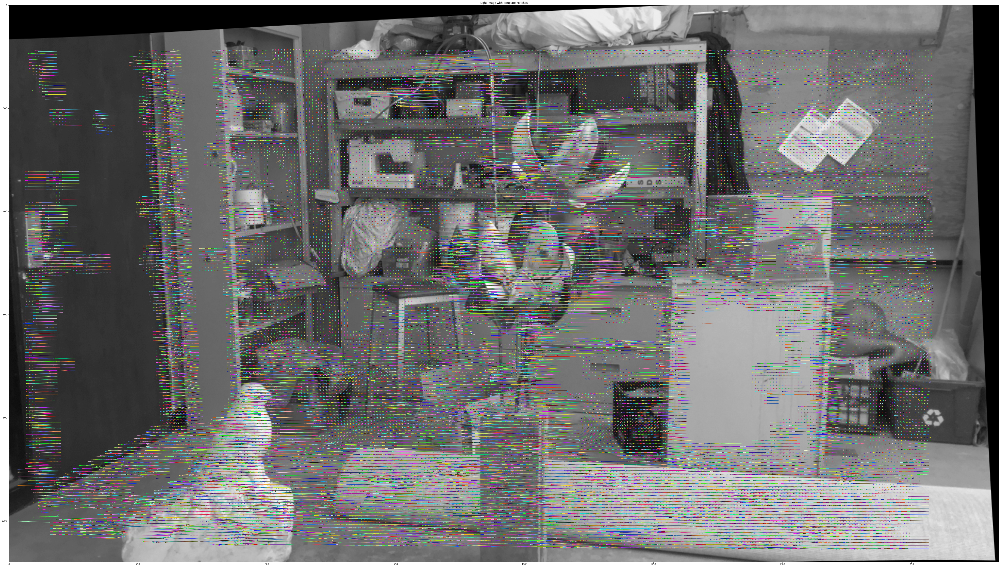

In [3]:
# Show how each template point deviated from center of search area
# Closer objects deviate more
plot_searches(img_right, search_area_centers, points_right)

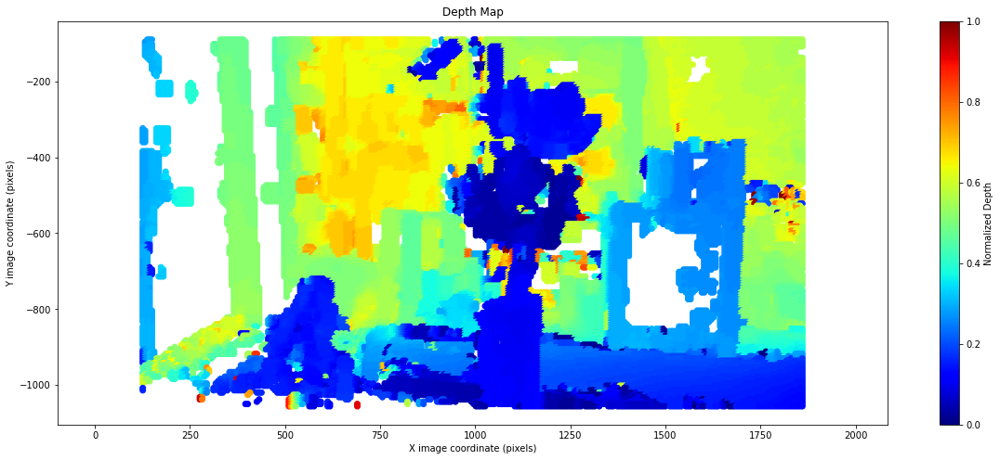

In [4]:
# Show depth map
plot_depth_map(img_points_3D)

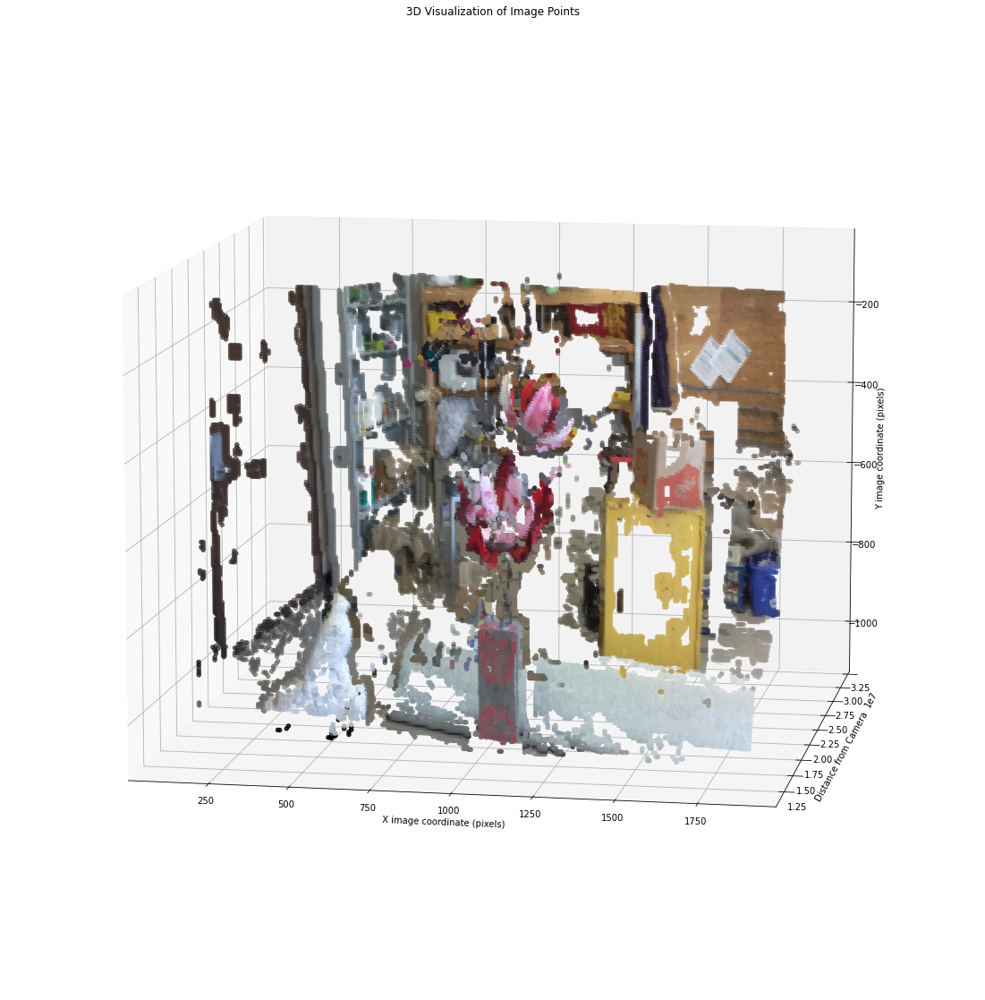

In [5]:
# Plot point cloud in 3D
plot_point_cloud(img_points_3D, colors, elev=10, azim=280)

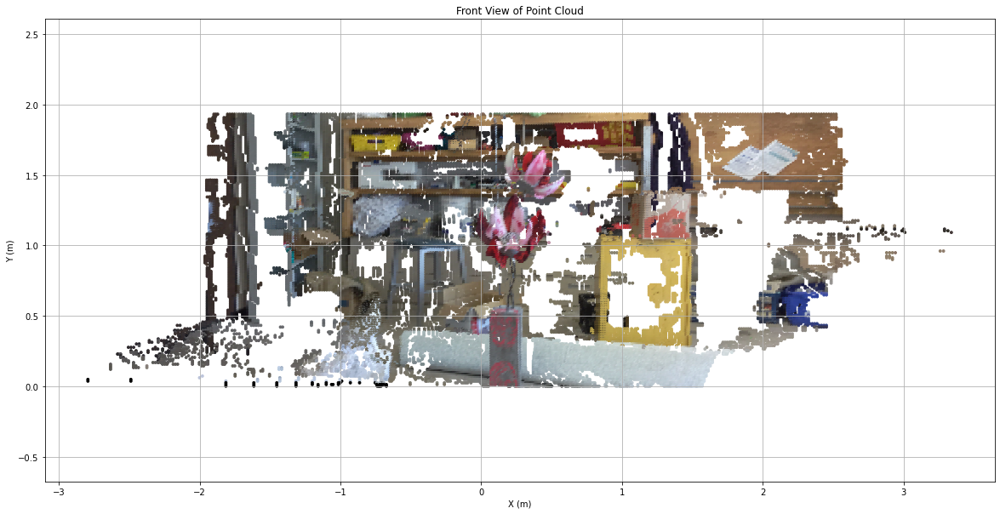

In [6]:
# Plot projected points front view
plot_point_cloud_2D(projected_points_3D, colors)

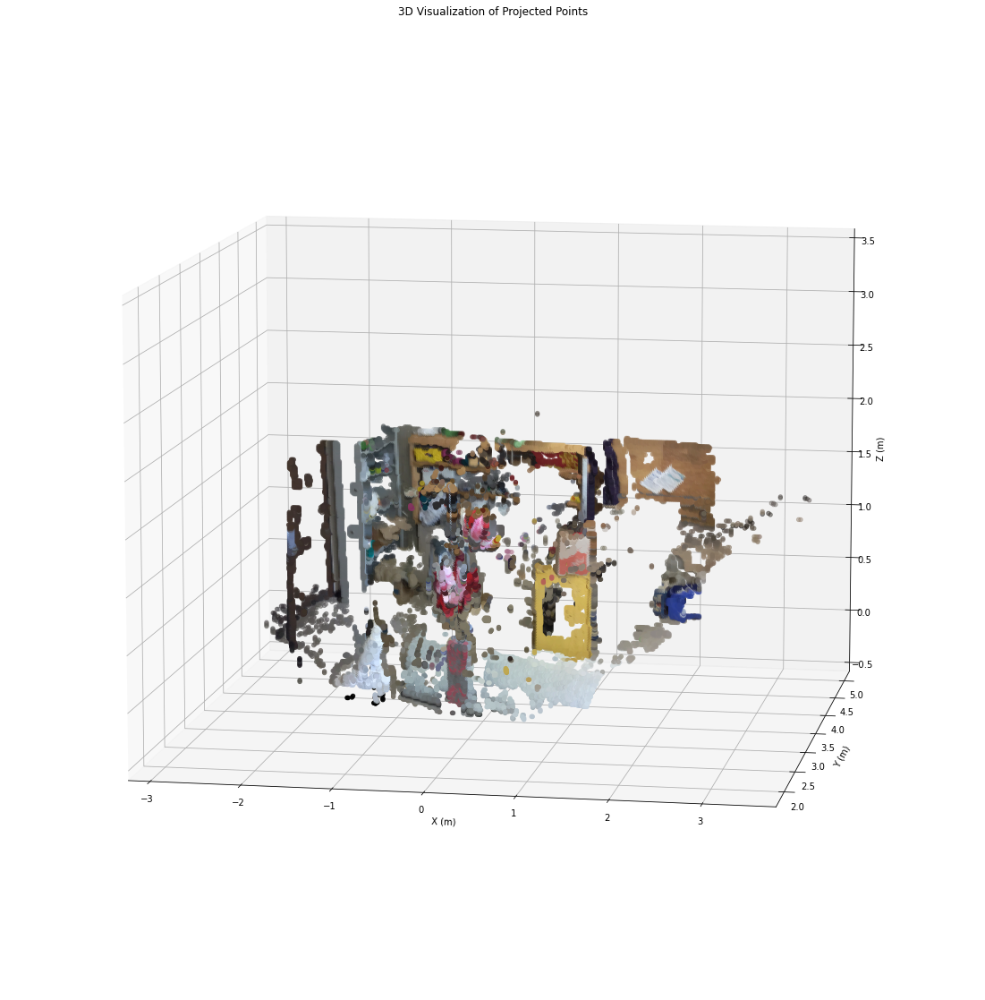

In [7]:
# Plot projected points in 3D
plot_point_cloud(projected_points_3D, colors, elev=10, azim=280, ym=1)